<center><h1>Luo_Xiao_HW6</h1></center>

Name: Xiao Luo
<br>
Github Username: xluo23
<br>
USC ID: 2392693288
<br>
Late Days Used: 2
<br>
Late Days Left: 4

## 1. Tree-Based Methods

Import packages

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

### (a) Download the APS Failure data

In [4]:
train = pd.read_csv("data/aps_failure_training_set.csv", skiprows = 20)
test = pd.read_csv("data/aps_failure_test_set.csv", skiprows = 20)
# display(train)

X_train = train.iloc[:, 1:] 
y_train = train.iloc[:, 0]
y_train = y_train.map({'pos':1, 'neg':0})
# print(X_train)
# print(y_train)

X_test = test.iloc[:, 1:] 
y_test = test.iloc[:, 0]
y_test = y_test.map({'pos':1, 'neg':0})
# print(X_test)
# print(y_test)


### (b) Data Preparation

#### (i) Research what types of techniques are usually used

Common methods to imputing missing data:

    * Mean imputation
    * Substitution
    * Hot deck imputation
    * Cold deck imputation
    * Regression imputation
    * Stochastic regression imputation
    * Interpolation and extrapolation

(reference: https://www.theanalysisfactor.com/seven-ways-to-make-up-data-common-methods-to-imputing-missing-data/)

I pick median imputation to deal with data with missing values for the next step.





In [5]:
from sklearn.impute import SimpleImputer

# df = pd.concat([train, test])
# X_df = df.iloc[:, 1:] 
# y_df = df.iloc[:, 0]

for column in X_train:
    X_train[column] = pd.to_numeric(X_train[column],errors='coerce')
for column in X_test:
    X_test[column] = pd.to_numeric(X_test[column],errors='coerce')

imp_mean = SimpleImputer(missing_values=np.nan, strategy='median')
imp_mean.fit(X_train)

imp_train = pd.DataFrame(imp_mean.fit_transform(X_train),columns = X_train.columns)
imp_test = pd.DataFrame(imp_mean.fit_transform(X_test),columns = X_train.columns)
display(imp_train)
display(imp_test)

,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,76698.0,0.0,2.130706e+09,280.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0
1,33058.0,0.0,0.000000e+00,126.0,0.0,0.0,0.0,0.0,0.0,0.0,...,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0
2,41040.0,0.0,2.280000e+02,100.0,0.0,0.0,0.0,0.0,0.0,0.0,...,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0
3,12.0,0.0,7.000000e+01,66.0,0.0,10.0,0.0,0.0,0.0,318.0,...,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0
4,60874.0,0.0,1.368000e+03,458.0,0.0,0.0,0.0,0.0,0.0,0.0,...,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,153002.0,0.0,6.640000e+02,186.0,0.0,0.0,0.0,0.0,0.0,2564.0,...,998500.0,566884.0,1290398.0,1218244.0,1019768.0,717762.0,898642.0,28588.0,0.0,0.0
59996,2286.0,0.0,2.130707e+09,224.0,0.0,0.0,0.0,0.0,0.0,0.0,...,10578.0,6760.0,21126.0,68424.0,136.0,0.0,0.0,0.0,0.0,0.0
59997,112.0,0.0,2.130706e+09,18.0,0.0,0.0,0.0,0.0,0.0,0.0,...,792.0,386.0,452.0,144.0,146.0,2622.0,0.0,0.0,0.0,0.0
59998,80292.0,0.0,2.130706e+09,494.0,0.0,0.0,0.0,0.0,0.0,0.0,...,699352.0,222654.0,347378.0,225724.0,194440.0,165070.0,802280.0,388422.0,0.0,0.0


,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,60.0,0.0,2.000000e+01,12.0,0.0,0.0,0.0,0.0,0.0,2682.0,...,1098.0,138.0,412.0,654.0,78.0,88.0,0.0,0.0,0.0,0.0
1,82.0,0.0,6.800000e+01,40.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1068.0,276.0,1620.0,116.0,86.0,462.0,0.0,0.0,0.0,0.0
2,66002.0,2.0,2.120000e+02,112.0,0.0,0.0,0.0,0.0,0.0,199486.0,...,495076.0,380368.0,440134.0,269556.0,1315022.0,153680.0,516.0,0.0,0.0,0.0
3,59816.0,0.0,1.010000e+03,936.0,0.0,0.0,0.0,0.0,0.0,0.0,...,540820.0,243270.0,483302.0,485332.0,431376.0,210074.0,281662.0,3232.0,0.0,0.0
4,1814.0,0.0,1.560000e+02,140.0,0.0,0.0,0.0,0.0,0.0,0.0,...,7646.0,4144.0,18466.0,49782.0,3176.0,482.0,76.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,81852.0,0.0,2.130706e+09,892.0,0.0,0.0,0.0,0.0,0.0,0.0,...,632658.0,273242.0,510354.0,373918.0,349840.0,317840.0,960024.0,25566.0,0.0,0.0
15996,18.0,0.0,5.200000e+01,46.0,8.0,26.0,0.0,0.0,0.0,0.0,...,266.0,44.0,46.0,14.0,2.0,0.0,0.0,0.0,0.0,0.0
15997,79636.0,0.0,1.670000e+03,1518.0,0.0,0.0,0.0,0.0,0.0,0.0,...,806832.0,449962.0,778826.0,581558.0,375498.0,222866.0,358934.0,19548.0,0.0,0.0
15998,110.0,0.0,3.600000e+01,32.0,0.0,0.0,0.0,0.0,0.0,0.0,...,588.0,210.0,180.0,544.0,1004.0,1338.0,74.0,0.0,0.0,0.0


#### (ii) Calculate the coefficient of variation

In [44]:
X = pd.concat([imp_train, imp_test])
y = pd.concat([y_train, y_test])

# s = np.std(imp_train, axis=0)
# m = np.mean(imp_train, axis=0)

s = np.std(X, axis=0)
m = np.mean(X, axis=0)

cv = s / m
cv

aa_000      4.328579
ab_000      9.740457
ac_000      2.309284
ad_000    274.789265
ae_000     23.271204
             ...    
ee_007      4.935340
ee_008      3.373863
ee_009      5.820969
ef_000     50.223351
eg_000     47.845078
Length: 170, dtype: float64

#### (iii) Plot a correlation matrix

,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
aa_000,1.000000,0.009953,-0.037851,-0.000801,0.023778,0.033524,0.011686,0.076387,0.195179,0.307466,...,0.414099,0.419885,0.409629,0.419754,0.425623,0.356954,0.259626,0.133790,0.005648,0.009239
ab_000,0.009953,1.000000,-0.002489,-0.000372,0.034129,0.053156,-0.000206,0.006841,0.024010,0.037640,...,-0.000332,0.010885,0.001855,0.012072,0.016158,0.010747,-0.026319,-0.017057,0.051733,0.077262
ac_000,-0.037851,-0.002489,1.000000,-0.001568,-0.004005,-0.009773,0.015077,-0.007137,-0.022578,-0.046973,...,-0.047540,-0.041136,-0.040612,-0.041437,-0.047661,-0.048884,-0.004806,0.012019,-0.006200,0.016273
ad_000,-0.000801,-0.000372,-0.001568,1.000000,-0.000156,-0.000190,-0.000038,-0.000085,-0.000202,-0.000407,...,-0.001343,-0.001350,-0.001318,-0.001092,-0.001054,-0.000722,-0.001060,-0.000622,-0.000072,-0.000076
ae_000,0.023778,0.034129,-0.004005,-0.000156,1.000000,0.830001,-0.000465,-0.000953,0.000977,0.018881,...,0.009860,0.016805,0.010357,0.023873,0.063898,0.034168,-0.009518,-0.007330,0.063622,0.030893
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ee_007,0.356954,0.010747,-0.048884,-0.000722,0.034168,0.043477,0.007652,0.067999,0.181955,0.475604,...,0.442405,0.433122,0.419858,0.380362,0.543650,1.000000,0.227539,0.063395,-0.001551,-0.000363
ee_008,0.259626,-0.026319,-0.004806,-0.001060,-0.009518,-0.012225,0.000102,0.005364,0.009142,0.020924,...,0.442837,0.470860,0.448712,0.394357,0.366141,0.227539,1.000000,0.690270,-0.005663,-0.002474
ee_009,0.133790,-0.017057,0.012019,-0.000622,-0.007330,-0.009004,-0.001082,-0.003530,-0.009065,-0.018009,...,0.224864,0.236117,0.221076,0.184135,0.158956,0.063395,0.690270,1.000000,-0.003312,-0.001216
ef_000,0.005648,0.051733,-0.006200,-0.000072,0.063622,0.093517,-0.000086,0.000960,0.005119,0.010094,...,0.002271,0.008862,0.001752,0.025645,0.003997,-0.001551,-0.005663,-0.003312,1.000000,0.222595


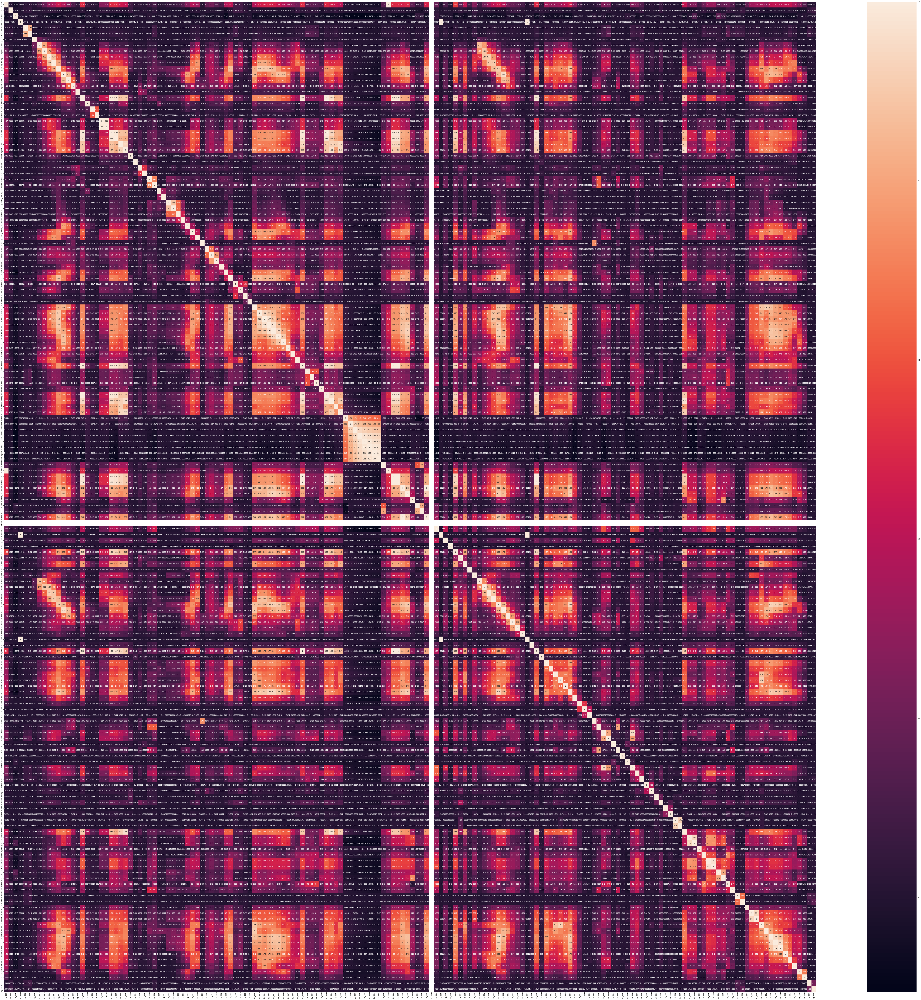

In [5]:
corr = X.corr()
display(corr)

fig, ax = plt.subplots(figsize=(122, 122))
sns.heatmap(corr, annot=True)
plt.show()

#### (iv) Make scatter plots and box plots

In [12]:
feature_num = int(170**(1/2))
sorted_cv = cv.sort_values(ascending=False)
high_cv = sorted_cv[:feature_num]
display(high_cv)

highCV_features = ['cf_000','co_000','ad_000','cs_009','dj_000','dh_000',
      'df_000','as_000','ag_000','au_000','ak_000','az_009','ay_009']
highCV_X = X.loc[:, highCV_features]
highCV_X

cf_000    275.594006
co_000    275.066328
ad_000    274.789265
cs_009    194.719656
dj_000    130.914372
dh_000    120.758710
df_000    119.383625
as_000    115.081320
ag_000     92.506902
au_000     86.991676
ak_000     84.874588
az_009     78.894989
ay_009     78.350353
dtype: float64

,cf_000,co_000,ad_000,cs_009,dj_000,dh_000,df_000,as_000,ag_000,au_000,ak_000,az_009,ay_009
0,2.0,220.0,280.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2.0,8.0,126.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2.0,2.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,202.0,458.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,2.0,42.0,892.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15996,2.0,0.0,46.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15997,2.0,378.0,1518.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15998,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<Figure size 432x288 with 0 Axes>

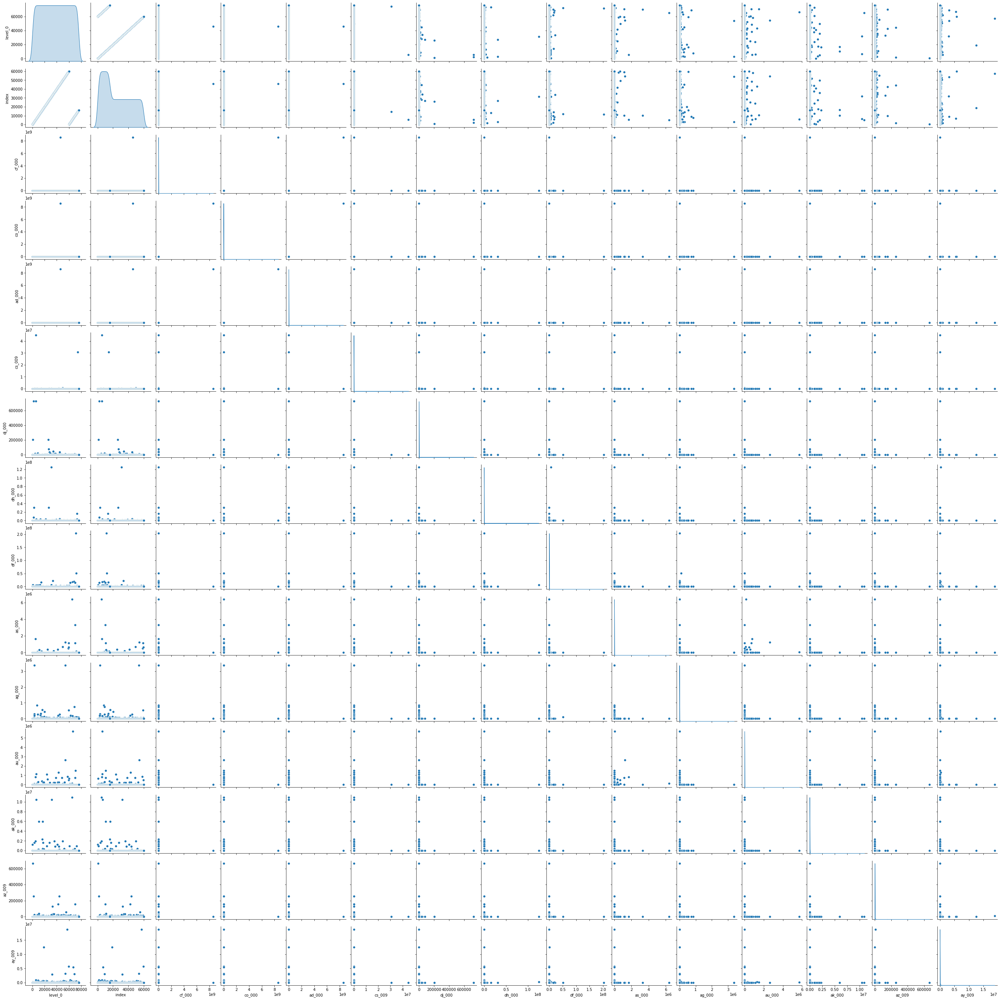

In [92]:
# create scatter plot
highCV_X = highCV_X.reset_index()
fig = plt.figure()
sns.pairplot(highCV_X, diag_kind="kde")
plt.show()

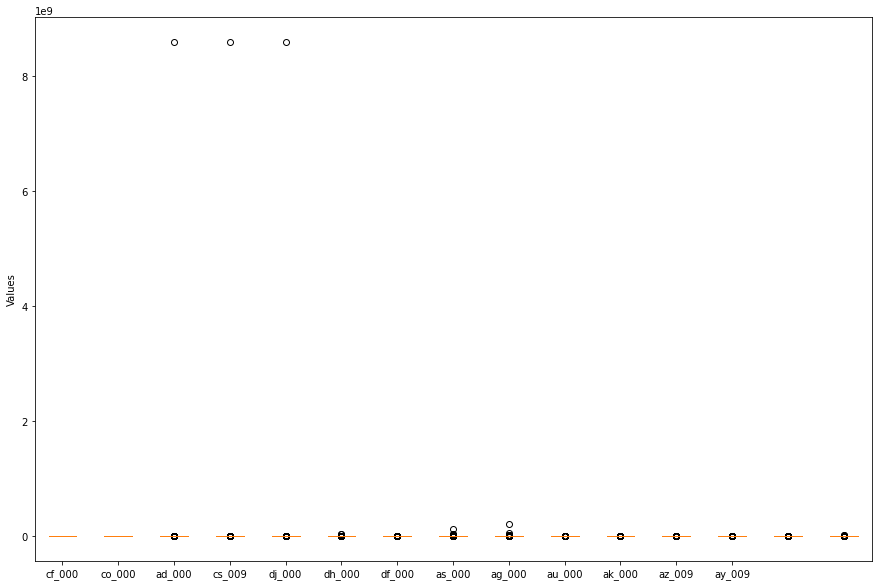


Conclusion:
Just by the scatter plots, we cannot determine the significance of those features.
    


In [93]:
# create box plot
fig = plt.figure(figsize=(15,10))
plt.boxplot(highCV_X)
plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12,13], highCV_features)
plt.ylabel('Values')
plt.show()

print('''
Conclusion:
Just by the scatter plots, we cannot determine the significance of those features.
    ''')

#### (v) Is this data set imbalanced?

In [45]:
print(y.value_counts())

print("\nSince the ratio between the number of positive data and number of negative data is about 1:54 so this data set is imbalanced.")

0    74625
1     1375
Name: class, dtype: int64

Since the ratio between the number of positive data and number of negative data is about 1:54 so this data set is imbalanced.


### (c) Train a random forest

Confusion Matrix for Training Set:
 [[59000     0]
 [    0  1000]]
Misclassification Rate for Training Set: 0.0


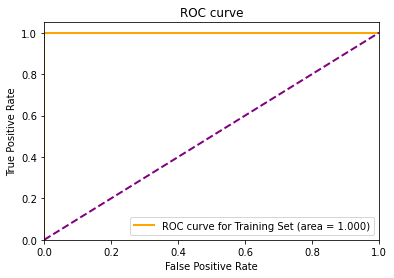

AUC for Training Set: 1.0


In [15]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, confusion_matrix, roc_curve, auc
from sklearn.metrics import mean_squared_error

rfc = RandomForestClassifier(oob_score = True)
rfc = rfc.fit(imp_train, y_train)
train_pred = rfc.predict(imp_train)

train_cm = confusion_matrix(y_train, train_pred)
train_misclassification = 1 - rfc.score(imp_train, y_train)
print("Confusion Matrix for Training Set:\n", train_cm)
print("Misclassification Rate for Training Set:", train_misclassification)

# calculate & plot the ROC curve
train_pred_prob = rfc.predict_proba(imp_train)[:,1]
fpr, tpr, thresholds = roc_curve(y_train, train_pred_prob)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='orange', lw=2, label='ROC curve for Training Set (area = %0.3f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='purple', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve')
plt.legend(loc="lower right")
plt.show()

# calculate AUC
auc = roc_auc_score(y_train, train_pred_prob)
print('AUC for Training Set:', auc)

Confusion Matrix for Test Set:
 [[15610    15]
 [  104   271]]
Misclassification Rate for Test Set: 0.007437499999999986


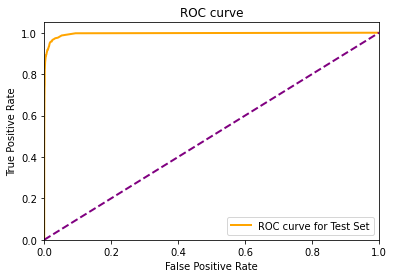

AUC for Test Set: 0.9954793813333334
Out of Bag Error for Test Set: 0.0059833333333333405
MSE Error for Test Set:  0.0074375

The Out of Bag error estimate for the random forset is lower than the test error.


In [87]:
test_pred = rfc.predict(imp_test)

test_cm = confusion_matrix(y_test, test_pred)
test_misclassification = 1 - rfc.score(imp_test, y_test)
print("Confusion Matrix for Test Set:\n", test_cm)
print("Misclassification Rate for Test Set:", test_misclassification)

# calculate & plot the ROC curve
test_pred_prob = rfc.predict_proba(imp_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, test_pred_prob)
# roc_auc = auc(fpr, tpr)
# print(roc_auc)

plt.figure()
plt.plot(fpr, tpr, color='orange', lw=2, label='ROC curve for Test Set')
plt.plot([0, 1], [0, 1], color='purple', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve')
plt.legend(loc="lower right")
plt.show()

# calculate AUC
auc = roc_auc_score(y_test, test_pred_prob)
print('AUC for Test Set:', auc)

# Calculate the Out of Bag (OOB) error estimate
print("Out of Bag Error for Test Set:", 1 - rfc.oob_score_)

print("MSE Error for Test Set: ", mean_squared_error(y_test, test_pred))

print("\nThe Out of Bag error estimate for the random forset is lower than the test error.")

### (d) Research class imbalance in random forest

How class imbalance is addressed in random forests:

    * Random Forest With Class Weighting
    * Random Forest With Bootstrap Class Weighting
    * Random Forest With Random Undersampling

(reference: https://machinelearningmastery.com/bagging-and-random-forest-for-imbalanced-classification/)


Confusion Matrix for Training Set:
 [[59000     0]
 [    0  1000]]
Misclassification Rate for Training Set: 0.0


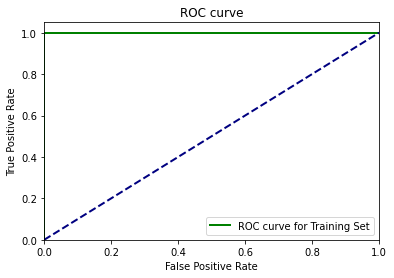

AUC for Training Set: 1.0


In [89]:
rfc2 = RandomForestClassifier(oob_score = True, class_weight="balanced")
rfc2 = rfc2.fit(imp_train, y_train)
train_pred = rfc2.predict(imp_train)

train_cm = confusion_matrix(y_train, train_pred)
train_misclassification = 1 - rfc2.score(imp_train, y_train)
print("Confusion Matrix for Training Set:\n", train_cm)
print("Misclassification Rate for Training Set:", train_misclassification)

# calculate & plot the ROC curve
train_pred_prob = rfc2.predict_proba(imp_train)[:,1]
fpr, tpr, thresholds = roc_curve(y_train, train_pred_prob)
# roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='green', lw=2, label='ROC curve for Training Set')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve')
plt.legend(loc="lower right")
plt.show()

# calculate AUC
auc = roc_auc_score(y_train, train_pred_prob)
print('AUC for Training Set:', auc)


Confusion Matrix for Test Set:
 [[15610    15]
 [  160   215]]
Misclassification Rate for Test Set: 0.010937500000000044


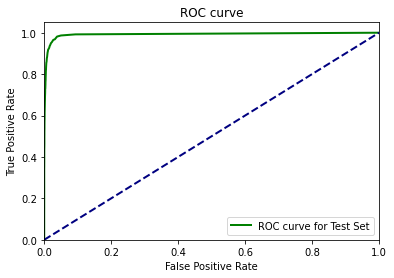

AUC for Test Set: 0.9920155306666667
Out of Bag Error for Test Set: 0.007916666666666683
MSE Error for Test Set:  0.0109375

The Out of Bag error estimate for the random forset is lower than the test error.


In [90]:
test_pred = rfc2.predict(imp_test)

test_cm = confusion_matrix(y_test, test_pred)
test_misclassification = 1 - rfc2.score(imp_test, y_test)
print("Confusion Matrix for Test Set:\n", test_cm)
print("Misclassification Rate for Test Set:", test_misclassification)

# calculate & plot the ROC curve
test_pred_prob = rfc2.predict_proba(imp_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, test_pred_prob)
# roc_auc = auc(fpr, tpr)
# print(roc_auc)

plt.figure()
plt.plot(fpr, tpr, color='green', lw=2, label='ROC curve for Test Set')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve')
plt.legend(loc="lower right")
plt.show()

# calculate AUC
auc = roc_auc_score(y_test, test_pred_prob)
print('AUC for Test Set:', auc)

# Calculate the Out of Bag (OOB) error estimate
print("Out of Bag Error for Test Set:", 1 - rfc2.oob_score_)

print("MSE Error for Test Set: ", mean_squared_error(y_test, test_pred))

print("\nThe Out of Bag error estimate for the random forset is lower than the test error.")

### (e) XGBoost and Model Trees

In [25]:
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import GridSearchCV

alphas = np.linspace(0.1, 5, 10)
param_grid = {'alpha': alphas}
xgbc = XGBClassifier(objective='binary:logistic',random_state=42)
lr = LogisticRegression(penalty='l1', solver='liblinear', random_state=42)
xgbc.estimator = lr
clf = GridSearchCV(xgbc, param_grid, cv=5, scoring='accuracy')
clf.fit(imp_train, y_train)
print('Best alpha:', clf.best_params_['alpha'])
print('Cross-validation score:', clf.best_score_)

Best alpha: 1.188888888888889
Cross-validation score: 0.9948666666666666


In [13]:
xgbc = XGBClassifier(objective='binary:logistic',random_state=42)
lr = LogisticRegression(penalty='l1', solver='liblinear', random_state=42, C=clf.best_params_['alpha'])
xgbc.estimator = lr
xgbc.fit(imp_train, y_train)
test_error = 1 - xgbc.score(imp_test, y_test)
print('Test error:', test_error)
print('Cross-validation estimated error:', 1 - clf.best_score_)
print("Compared these two errors, the estimated error using 5 fold cv method is smaller than the test error.")

Test error: 0.006249999999999978
Cross-validation estimated error: 0.005133333333333434
Compared these two errors, the estimated error using 5 fold cv method is smaller than the test error.


Confusion Matrix for Training Set:
 [[59000     0]
 [    1   999]]


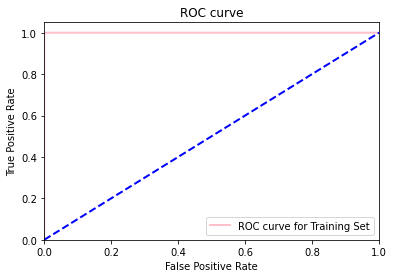

AUC for Training Set: 0.9999991355932203


In [23]:
# Report the Confusion Matrix, ROC, and AUC for training set
train_pred_xgb = xgbc.predict(imp_train)
train_cm = confusion_matrix(y_train, train_pred_xgb)
print("Confusion Matrix for Training Set:\n", train_cm)

# calculate & plot the ROC curve
train_pred_prob = xgbc.predict_proba(imp_train)[:,1]
fpr, tpr, thresholds = roc_curve(y_train, train_pred_prob)
# roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='pink', lw=2, label='ROC curve for Training Set')
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve')
plt.legend(loc="lower right")
plt.show()

# calculate AUC
auc = roc_auc_score(y_train, train_pred_prob)
print('AUC for Training Set:', auc)

Confusion Matrix for Test Set:
 [[15610    15]
 [   85   290]]


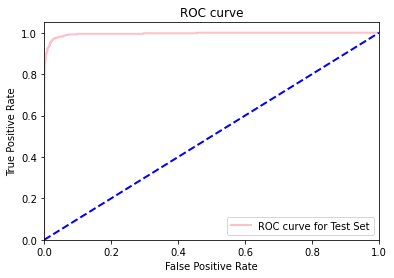

AUC for Test Set: 0.9951453866666666


In [24]:
# Report the Confusion Matrix, ROC, and AUC for test sets
test_pred_xgb = xgbc.predict(imp_test)
test_cm = confusion_matrix(y_test, test_pred_xgb)
print("Confusion Matrix for Test Set:\n", test_cm)

# calculate & plot the ROC curve
test_pred_prob = xgbc.predict_proba(imp_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, test_pred_prob)
# roc_auc = auc(fpr, tpr)
# print(roc_auc)

plt.figure()
plt.plot(fpr, tpr, color='pink', lw=2, label='ROC curve for Test Set')
plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve')
plt.legend(loc="lower right")
plt.show()

# calculate AUC
auc = roc_auc_score(y_test, test_pred_prob)
print('AUC for Test Set:', auc)

### (f) Use SMOTE to pre-process your data

In [29]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(sampling_strategy='minority', random_state=42)
X_train_sm, y_train_sm = sm.fit_resample(imp_train, y_train)

alphas = np.linspace(0.1, 5, 10)
param_grid = {'alpha': alphas}
xgbc2 = XGBClassifier(objective='binary:logistic',random_state=42)
lr2 = LogisticRegression(penalty='l1', solver='liblinear', random_state=42)
xgbc2.estimator = lr2
clf2 = GridSearchCV(xgbc2, param_grid, cv=5, scoring='accuracy')
clf2.fit(X_train_sm, y_train_sm)
print('Best alpha:', clf2.best_params_['alpha'])
print('Cross-validation score:', clf2.best_score_)

Best alpha: 0.1
Cross-validation score: 0.9972966101694916


In [31]:
xgbc2 = XGBClassifier(objective='binary:logistic',random_state=42)
lr2 = LogisticRegression(penalty='l1', solver='liblinear', random_state=42, C=clf2.best_params_['alpha'])
xgbc2.estimator = lr2
xgbc2.fit(X_train_sm, y_train_sm)
test_error2 = 1 - xgbc2.score(imp_test, y_test)
print('Test error:', test_error2)
print('Cross-validation estimated error:', 1 - clf2.best_score_)
print("Compared these two errors, the estimated error using 5 fold cv method is smaller than the test error.")

Test error: 0.008750000000000036
Cross-validation estimated error: 0.0027033898305084403
Compared these two errors, the estimated error using 5 fold cv method is smaller than the test error.


Confusion Matrix for Training Set:
 [[59000     0]
 [    1 58999]]


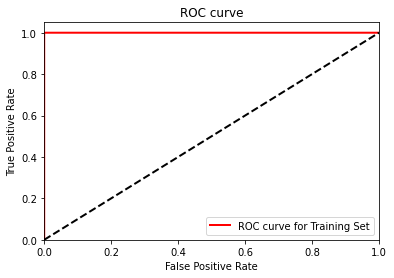

AUC for Training Set: 0.999999619649526


In [36]:
# Report the Confusion Matrix, ROC, and AUC for training set
train_pred_xgb2 = xgbc2.predict(X_train_sm)
train_cm2 = confusion_matrix(y_train_sm, train_pred_xgb2)
print("Confusion Matrix for Training Set:\n", train_cm2)

# calculate & plot the ROC curve
train_pred_prob2 = xgbc2.predict_proba(X_train_sm)[:,1]
fpr, tpr, thresholds = roc_curve(y_train_sm, train_pred_prob2)
# roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='red', lw=2, label='ROC curve for Training Set')
plt.plot([0, 1], [0, 1], color='black', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve')
plt.legend(loc="lower right")
plt.show()

# calculate AUC
auc = roc_auc_score(y_train_sm, train_pred_prob2)
print('AUC for Training Set:', auc)

Confusion Matrix for Test Set:
 [[15539    86]
 [   54   321]]


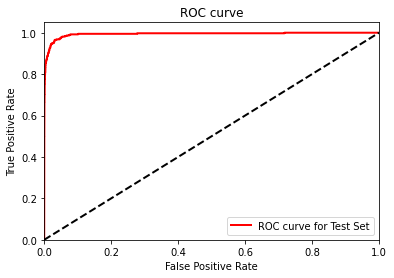

AUC for Test Set: 0.9933436586666666


In [37]:
# Report the Confusion Matrix, ROC, and AUC for test sets
test_pred_xgb2 = xgbc2.predict(imp_test)
test_cm2 = confusion_matrix(y_test, test_pred_xgb2)
print("Confusion Matrix for Test Set:\n", test_cm2)

# calculate & plot the ROC curve
test_pred_prob2 = xgbc2.predict_proba(imp_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, test_pred_prob2)
# roc_auc = auc(fpr, tpr)
# print(roc_auc)

plt.figure()
plt.plot(fpr, tpr, color='red', lw=2, label='ROC curve for Test Set')
plt.plot([0, 1], [0, 1], color='black', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve')
plt.legend(loc="lower right")
plt.show()

# calculate AUC
auc = roc_auc_score(y_test, test_pred_prob2)
print('AUC for Test Set:', auc)

Compare the uncompensated case with SMOTE case, we can tell that the misclassification rate in SMOTE case is less than the uncompensated case.

## 2. ISLR 6.6.3

a. (iv). The training RSS will steadily decrease as s increase. Because when s increase, the model will become more flexible, which leads to a lower training RSS.

b. (ii). The test RSS will decrease at first since the flexibility of the model increses as s increses, and then start increasing as the model gets more flexible and causes overfitting.

c. (iii). When s increase, the flexibility of the model increses. As flexibility increases we see an increase in variance.

d. (iv). When s increase, the flexibility of the model increses. As flexibility increases we see a decrease in bias.

e. (v). Because the irreducible error is not affected by the flexibility of the model. It will always be present and cannot be reduced.

## 3. ISLR 6.6.5

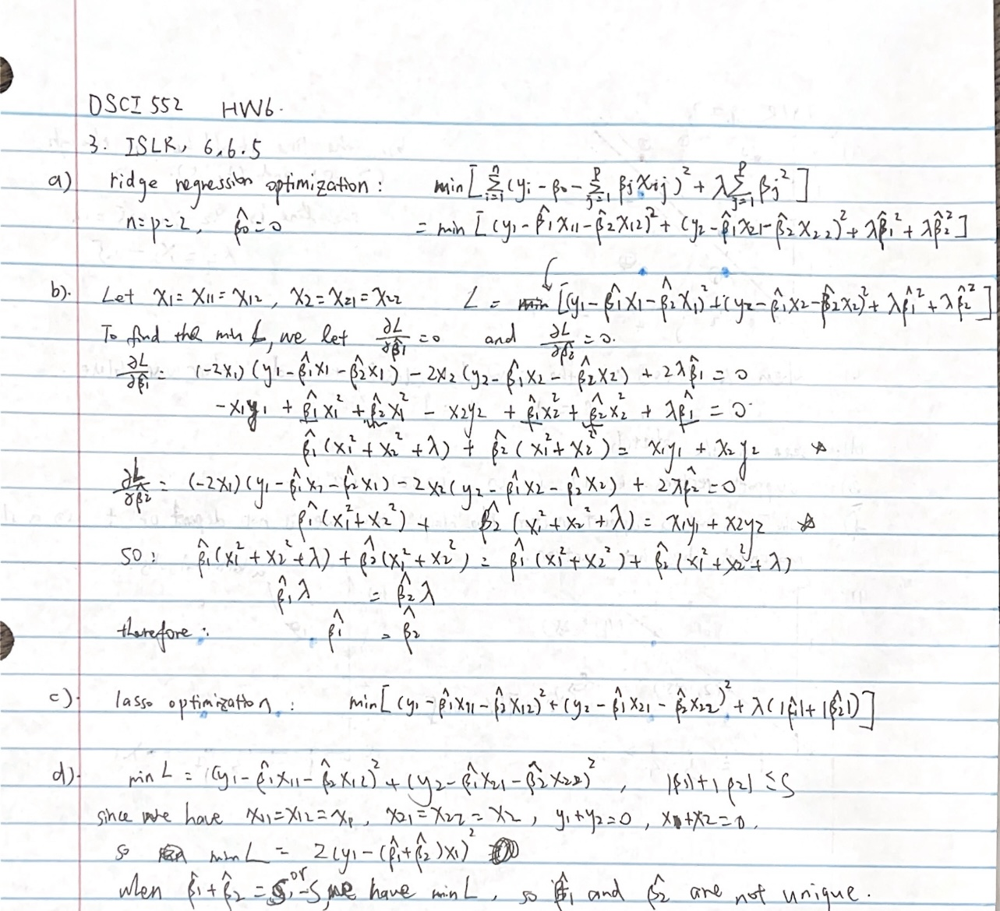

In [35]:
from IPython.display import Image
Image('1.jpg')

## 4. ISLR 8.4.5

Suppose we produce ten bootstrapped samples from a data set containing red and green classes. We then apply a classification tree to each bootstrapped sample and, for a specific value of X, produce 10 estimates of P(Class is Red|X):      
                    
                    0.1,0.15,0.2,0.2,0.55,0.6,0.6,0.65,0.7, and 0.75.   
                    
There are two common ways to combine these results together into a single class prediction. One is the majority vote approach discussed in this chapter. The second approach is to classify based on the average probability. In this example, what is the final classification under each of these two approaches?

Answer:
- Method 1: The final classification based on the majority voting is red, because in the 10 estimates of P(Class is Red|X), there are 6 out of 10 times that the probability is larger than 0.5.

- Method 2: The final classification based on the average probability is green, because the average probability of 10 estimates is (0.1 + 0.15 + 0.2 + 0.2 + 0.55 + 0.6 + 0.6 + 0.65 + 0.7 + 0.75)/10 = 0.45 < 0.5

## 5. ISLR 9.7.3

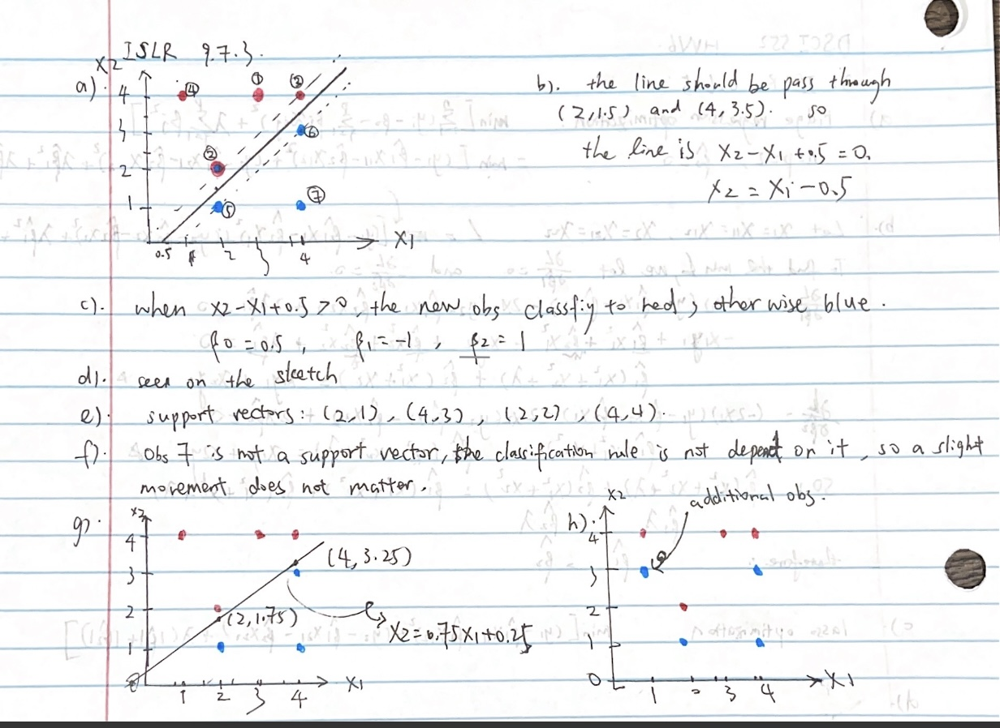

In [34]:
Image('2.jpg')